In [289]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import skimage.morphology as sk
import re

In [290]:
laplacian_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Preprocessing

- Creation of auxiliary arrays to browse trough the photos
- Denoising of Scene photos 

## Denoising

In [291]:
def extract_number(string):
    # Using regex to find numbers in the string
    numbers = re.findall(r'\d+', string)
    # Returning the first number found (if any)
    return int(numbers[0]) if numbers else None

In [293]:
def denoise_image(img_path):
  
  img_index = extract_number(img_path)
  img= cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.medianBlur(img, 5)
  img = cv2.GaussianBlur(img, (5,5), 1)
  img = cv2.fastNlMeansDenoisingColored(img, None, 12, 12, 7, 21)
  img = cv2.filter2D(img, -1, laplacian_kernel)
  img_write = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

  cv2.imwrite(f'./dataset/denoised_scenes/scene{img_index}.png', img_write)
  

In [294]:
## SCENE ARRAYS CREATION
scenes_path = './dataset/scenes/scene'

scene_idx_start_a = 1
#TODO: ricorda di cambiare 3 in 5
scene_idx_end_a = 5
scene_idx_start_b = 6
scene_idx_end_b = 12

scenes_a = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_a, scene_idx_end_a + 1)]
scenes_b = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]

In [295]:
#SCENE DENOISING
for scene in scenes_a:
    denoise_image(scene)
for scene in scenes_b:
    denoise_image(scene)

In [296]:
#DENOISED SCENES ARRAYS
dn_scenes_path = './dataset/denoised_scenes/scene'
dn_scenes_a = [f"{dn_scenes_path}{i}.png" for i in range(scene_idx_start_a, scene_idx_end_a + 1)]
dn_scenes_b = [f"{dn_scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]

#MODELS ARRAYS CREATION
models_path = './dataset/models/ref'

start_index_a = 1
end_index_a = 14
start_index_b = 15
end_index_b = 27

objs_a = [f"{models_path}{i}.png" for i in range(start_index_a, end_index_a )]
objs_b = [f"{models_path}{i}.png" for i in range(start_index_b, end_index_b )]

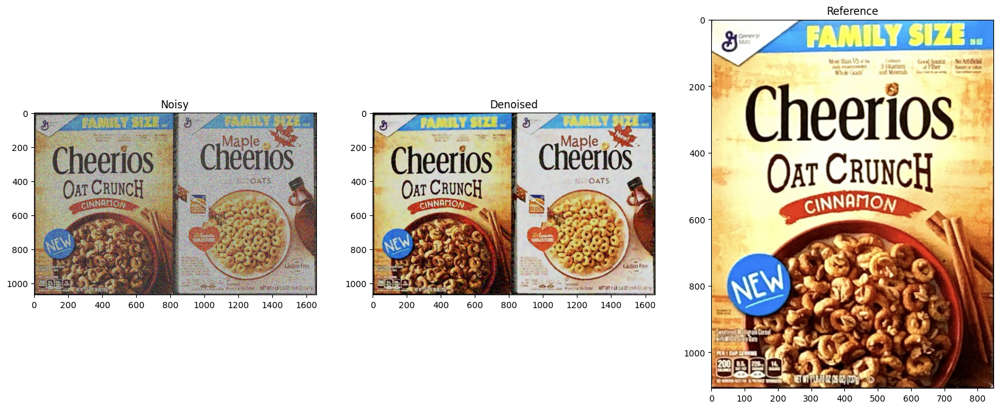

In [297]:
#show noisy vs denoised
scene1_img = cv2.imread(scenes_a[0])
scene1_rgb = cv2.cvtColor(scene1_img, cv2.COLOR_BGR2RGB)

scene1dn_img = cv2.imread(dn_scenes_a[0])
scene1dn_rgb = cv2.cvtColor(scene1dn_img, cv2.COLOR_BGR2RGB)

obj_image = cv2.imread('./dataset/models/ref1.png')
obj_rgb = cv2.cvtColor(obj_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.title('Noisy')
plt.imshow(scene1_rgb)

plt.subplot(1,3,2)
plt.title('Denoised')
plt.imshow(scene1dn_rgb)

plt.subplot(1,3,3)
plt.title('Reference')
plt.imshow(obj_rgb)

plt.show()

## Color histogram

In [314]:
def compute_color_histogram(image, bins=(8, 8, 8)):
    # Convert the image to the HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Compute the histogram and normalize it
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist)

    return hist

In [299]:
def plot_histogram(hist, title, color_space='HSV'):
    # Plotting the histogram for the three channels
    plt.figure()
    plt.title(title)
    plt.xlabel("Bins")
    plt.ylabel("Frequency")

    colors = ('b', 'g', 'r')
    for i, color in enumerate(colors):
        plt.plot(hist[i], color=color)
    plt.show()

def visualize_histograms(img_obj, roi_train):
    # Compute histograms
    hist_query = compute_color_histogram(img_obj)
    hist_roi_train = compute_color_histogram(roi_train)

    # Visualize histograms
    plot_histogram(hist_query, "Histogram for Query Image")
    plot_histogram(hist_roi_train, "Histogram for ROI in Train Image")


In [ ]:
#TODO:add tests to see effect of histograms and shit

# Track A

In [301]:
sift = cv2.xfeatures2d.SIFT_create()
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

In [316]:
def show_matches(background, instances):
    '''
    background is the path to the denoised background image
    instances is an array which contains elements structured like:
        [height, width, position[], path_to_image]
        - height: height of the bounding box
        - width: width of the bounding box
        - position: [x, y] coordinates of the top-left corner
        - path_to_image: path to the object image
    '''
    img_scene=background.copy()

    # Draw bounding boxes on the background image
    for instance in instances:
        
        height, width, position, _ = instance
        top_left_x, top_left_y = int(position[0]), int(position[1])
        bottom_right_x = top_left_x + int(width)
        bottom_right_y = top_left_y + int(height)
        
        # Draw rectangle on the background image
        img_scene = cv2.rectangle(img_scene, 
                                  (top_left_x, top_left_y), 
                                  (bottom_right_x, bottom_right_y), 
                                  (255, 0, 0), 20)  # Red bounding box with thickness of 2

    # Set up the plot with subplots
    n = len(instances) + 1
    plt.figure(figsize=(20, 5))
    
    # Show the background image with bounding boxes as the first subplot
    plt.subplot(1, n, 1)
    plt.imshow(img_scene)
    plt.title("Background with Bounding Boxes")
    
    # Show each instance image in its own subplot
    for i, instance in enumerate(instances):
        _, _, _, obj = instance
        
        # Display object image in a subplot
        plt.subplot(1, n, i + 2)
        plt.imshow(obj)
        plt.title(f"Object {i + 1}")
    
    plt.show()

In [304]:
def draw_boxes(kp_obj, kp_scene, obj, scene, good, scene_ind, obj_ind):
    
    """
    Draw bounding boxes and save information for each instance of the query found in the train image.

    Parameters:
        kp_obj (list): Keypoints of the object image.
        kp_scene (list): Keypoints of the scene image.
        img_obj (ndarray): Object (query) image.
        img_scene (ndarray): Scene (train) image.
        good (list): Good matches after Lowe's ratio test.
        scene_ind (int): Index of the scene being processed.
        obj_ind (int): Index of the object being processed.

    Returns:
        tuple: Processed train image and a list of instance data.
    """
    img_obj = obj.copy()
    img_scene = scene.copy()

    # Correspondences from good matches
    src_pts = np.float32([kp_obj[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Estimate robust homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    # Corners of the query image
    h, w = img_obj.shape[:2]
    pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)

    # Extract the bounding box
    coordinate = np.int32(dst).reshape(-1, 2)
    x, y, w, h = cv2.boundingRect(coordinate)

    # Extracting the center coordinates
    x_center = x + w // 2
    y_center = y + h // 2

    # Perform histogram similarity check for insufficient matches
    if len(good) < 100:
        roi_train = img_scene[y:y + h, x:x + w]
        if roi_train.size == 0:
            return -1

        hist_threshold = 0.2
        hist_query = compute_color_histogram(img_obj)
        hist_train_roi = compute_color_histogram(roi_train)
        similarity = cv2.compareHist(hist_query, hist_train_roi, cv2.HISTCMP_CORREL)

        if similarity < hist_threshold:
            return -1

    # Log instance details
    print(
        f"Instance {obj_ind} found in scene {scene_ind} at position: "
        f"({x_center}, {y_center}), width: {w}px, height: {h}px"
    )
    
    ret_array = [h, w, dst[0][0], img_obj]
    return ret_array

In [305]:
def track_a(scene_original, obj_original, treshold, scene_index, obj_index):
    scene = scene_original.copy()
    obj = obj_original.copy()

    kp_scene = sift.detect(scene)
    kp_obj = sift.detect(obj)

    kp_scene, des_scene = sift.compute(scene, kp_scene)
    kp_obj, des_obj = sift.compute(obj, kp_obj)

    matches = flann.knnMatch(des_obj, des_scene, k=2)

    good_matches = []

    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good_matches.append(m)

    if len(good_matches)>treshold:
        #query = obj
        #train = scene
        
        ret_array = draw_boxes(kp_obj, kp_scene, obj, scene, good_matches, scene_index, obj_index)

        return ret_array
    else:
        return -1


Instance 1 found in scene 1 at position: (412, 539), width: 803px, height: 1049px
Instance 2 found in scene 1 at position: (1247, 533), width: 803px, height: 1049px


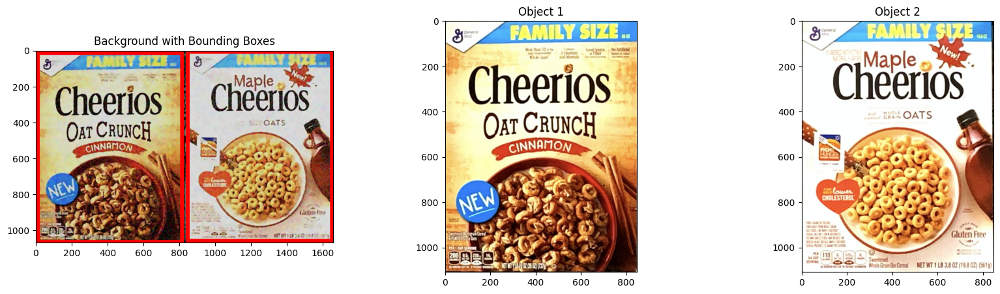

Instance 3 found in scene 2 at position: (305, 493), width: 605px, height: 942px
Instance 4 found in scene 2 at position: (928, 483), width: 634px, height: 952px
Instance 5 found in scene 2 at position: (1528, 450), width: 561px, height: 845px


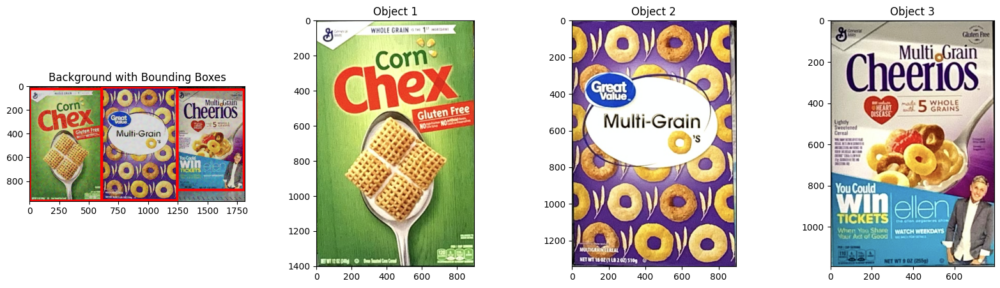

Instance 6 found in scene 3 at position: (299, 457), width: 603px, height: 673px
Instance 7 found in scene 3 at position: (889, 458), width: 550px, height: 655px
Instance 8 found in scene 3 at position: (1447, 397), width: 561px, height: 781px


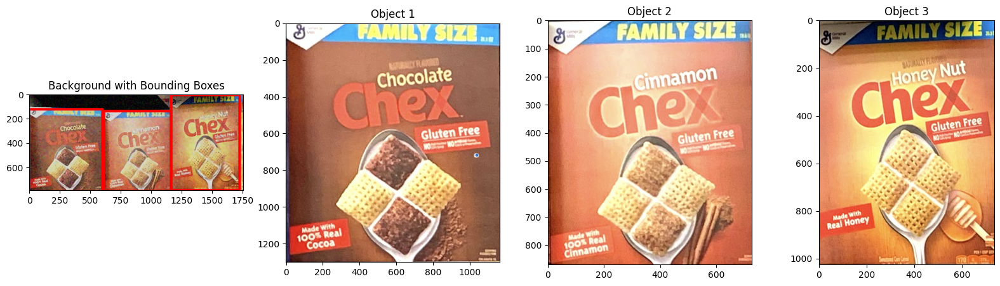

Instance 1 found in scene 4 at position: (887, 912), width: 383px, height: 515px
Instance 8 found in scene 4 at position: (350, 259), width: 351px, height: 494px


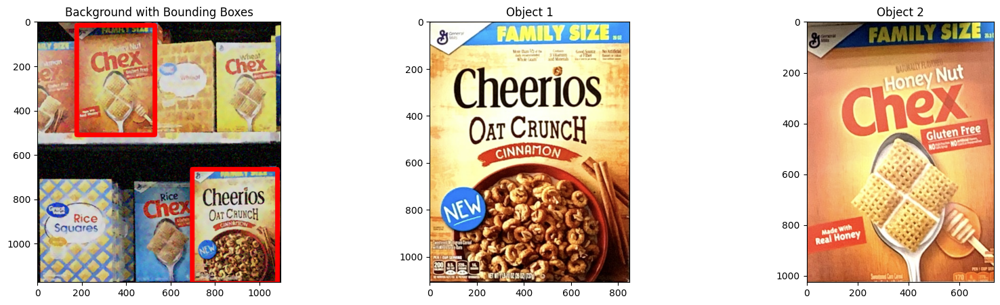

Instance 11 found in scene 5 at position: (368, 751), width: 368px, height: 555px
Instance 12 found in scene 5 at position: (714, 738), width: 441px, height: 655px


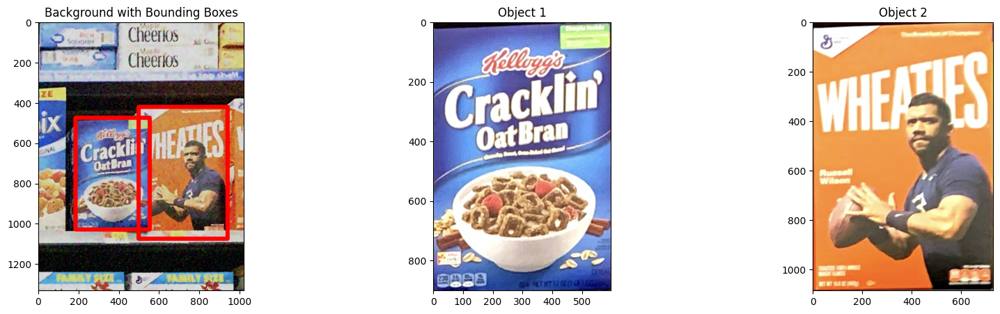

In [315]:
for scene_path in dn_scenes_a:
    objs_scenes=[]
    scene = cv2.imread(scene_path)
    scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)
    scene_index = extract_number(scene_path)
    for obj_path in objs_a:
        obj = cv2.imread(obj_path)
        obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)
        obj_index = extract_number(obj_path)
        
        ret_array=track_a(scene, obj,60, scene_index, obj_index)
        if not(ret_array==-1 or len(ret_array) !=4):
            objs_scenes.append(ret_array)
    show_matches(background=scene, instances=objs_scenes)
        

# TRACK B

In [ ]:
# ret_array=[h,w, dst[0][0], img_obj_path]

In [309]:
def draw_lines_track_b(kp_query, kp_train, img_query, img_train, good, instances):
    # Build the correspondences arrays of good matches
    src_pts = np.float32([kp_query[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_train[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Estimate a robust homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    matchesMask = mask.ravel().tolist()

    # Corners of the query image
    h, w = img_query.shape[:2]
    pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)

    # Extracting the bounding box
    coordinate = np.int32(dst).reshape(-1, 2)
    x, y, w, h = cv2.boundingRect(coordinate)

    # Extract the ROI from the train image
    roi_train = img_train[y:y+h, x:x+w]
    if roi_train.size == 0:
        return [], set()


    # Extract the indices of the keypoints in the scene in the ROI
    roi_indices = set()
    for i, kp in enumerate(kp_train):
        x_kp, y_kp = kp.pt
        if x <= x_kp < x + w and y <= y_kp < y + h:
            roi_indices.add(i)

    height, width, channels = img_train.shape
    if(h > height or x < 0 or y < 0):
        return [], roi_indices

    hist_threshold = 0.1

    # Compare histograms using correlation
    hist_query = compute_color_histogram(img_query)
    hist_train_roi = compute_color_histogram(roi_train)
    similarity = cv2.compareHist(hist_query, hist_train_roi, cv2.HISTCMP_CORREL)
    if similarity < hist_threshold:
        return [], roi_indices

    # Drawing the bounding box
    img_train = cv2.polylines(img_train, [coordinate], True, (255, 0, 0), 10, cv2.LINE_AA)
    img_train = cv2.circle(img_train, (x + w // 2, y + h // 2), 10, (255, 0, 0), -1)

    instance = {
        "width" : w,
        "height" : h,
        "x" : x,
        "y": y
    }

    instances.append(instance)
    return img_train, roi_indices

In [310]:
def draw_lines_track_b(kp_query, kp_train, img_query, img_train, good, instances):
    """
    Draws bounding boxes on detected objects and tracks the region of interest (ROI).
    
    Parameters:
        kp_query (list): Keypoints in the query image.
        kp_train (list): Keypoints in the train image.
        img_query (ndarray): Query image.
        img_train (ndarray): Train image.
        good (list): Good matches after ratio test.
        instances (list): List of detected instances (bounding boxes).

    Returns:
        tuple: Updated train image and set of ROI keypoint indices.
    """
    # Build the correspondences arrays of good matches
    src_pts = np.float32([kp_query[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_train[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Estimate a robust homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Corners of the query image
    h, w = img_query.shape[:2]
    pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)

    # Extracting the bounding box
    coordinate = np.int32(dst).reshape(-1, 2)
    x, y, w, h = cv2.boundingRect(coordinate)

    # Extract the ROI from the train image
    roi_train = img_train[y:y + h, x:x + w]
    if roi_train.size == 0:
        return [], set()

    # Extract the indices of the keypoints in the scene within the ROI
    roi_indices = {
        i for i, kp in enumerate(kp_train)
        if x <= kp.pt[0] < x + w and y <= kp.pt[1] < y + h
    }

    # Check if bounding box is valid
    height, width, _ = img_train.shape
    if h > height or x < 0 or y < 0:
        return [], roi_indices

    # Compare histograms using correlation
    hist_threshold = 0.1
    hist_query = compute_color_histogram(img_query)
    hist_train_roi = compute_color_histogram(roi_train)
    similarity = cv2.compareHist(hist_query, hist_train_roi, cv2.HISTCMP_CORREL)
    if similarity < hist_threshold:
        return [], roi_indices

    # Draw bounding box and center point
    img_train = cv2.polylines(img_train, [coordinate], True, (255, 0, 0), 10, cv2.LINE_AA)
    img_train = cv2.circle(img_train, (x + w // 2, y + h // 2), 10, (255, 0, 0), -1)

    # Record the detected instance
    instances.append({"width": w, "height": h, "x": x, "y": y})
    return img_train, roi_indices

In [311]:
def lowe_ratio_test_track_b(matches, min_match_count, kp_query, kp_train, img_query, img_train, instances):
    good = []

    # Collect the good matches by performing the lowe ratio test
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good)>min_match_count:
        train_img, good_kp = draw_lines_track_b(kp_query, kp_train, img_query, img_train, good, instances)
        if(len(train_img) == 0):
          return -1, good_kp
        return len(good), good_kp
    else:
        return -1, set()

In [312]:
def object_retrieve_track_b(img_query, img_train, min_match_count, instances, kp_train = []):

    # If no keypoints are given compute keypoints for scene
    if len(kp_train) == 0:
      kp_train = sift.detect(img_train)

    # Sift and detect for query and scene
    kp_query = sift.detect(img_query)
    kp_query, des_query = sift.compute(img_query, kp_query)
    kp_train, des_train = sift.compute(img_train, kp_train)

    matches = flann.knnMatch(des_query,des_train,k=2)
    found, good = lowe_ratio_test_track_b(matches, min_match_count, kp_query, kp_train, img_query, img_train, instances)

    # Create a set of all indices in kp_train
    all_train_indices = set(range(len(kp_train)))

    # Subtract matched_train_indices (good) from all_train_indices
    unmatched_train_indices = all_train_indices - good

    # Retrieve the keypoints corresponding to the remaining indices
    unmatched_keypoints = [kp_train[i] for i in unmatched_train_indices]

    return found, unmatched_keypoints, good

In [318]:
def track_b(scene, obj, kp_scene, instances, plot=True):
    found, kp_scene, good = object_retrieve_track_b(obj, scene, 12, instances, kp_scene)

    while(len(good) > 10):
        found, kp_scene, good = object_retrieve_track_b(obj, scene, 12, instances, kp_scene)

    if(len(instances) > 0):
        if plot:

            fig, axes = plt.subplots(1, 2, gridspec_kw={'width_ratios': [1, 2]})
            axes[0].imshow(obj)
            axes[0].axis('off')  # Turn off axis
            axes[0].set_title('Query')

            axes[1].imshow(scene)
            axes[1].axis('off')  # Turn off axis
            axes[1].set_title('Scene')
            plt.show()

        print("Product {} - {} instance found:".format(j, len(instances)))
        for i, instance in enumerate(instances):
            print("  Instance {}  [position: ({}, {}), width: {}px, height: {}px]". format(i, instance['x'], instance['y'], instance['width'], instance['height']))

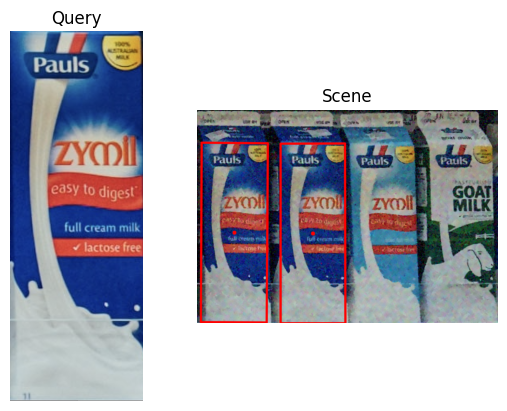

Product 15 - 2 instance found:
  Instance 0  [position: (420, 168), width: 327px, height: 906px]
  Instance 1  [position: (19, 164), width: 338px, height: 906px]


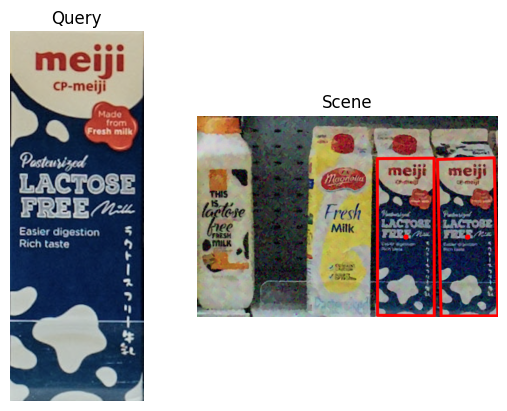

Product 16 - 2 instance found:
  Instance 0  [position: (915, 159), width: 231px, height: 604px]
  Instance 1  [position: (686, 160), width: 218px, height: 602px]


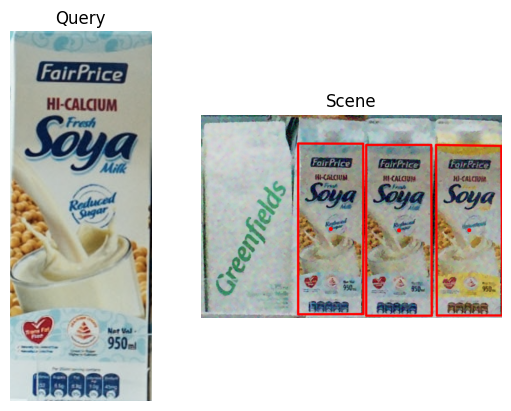

Product 17 - 3 instance found:
  Instance 0  [position: (485, 142), width: 327px, height: 854px]
  Instance 1  [position: (825, 149), width: 329px, height: 854px]
  Instance 2  [position: (1174, 149), width: 333px, height: 853px]


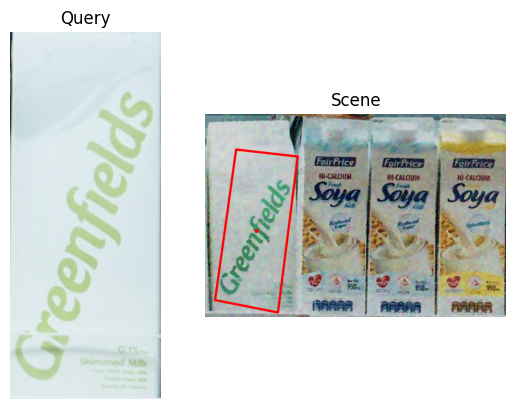

Product 18 - 1 instance found:
  Instance 0  [position: (50, 177), width: 414px, height: 815px]


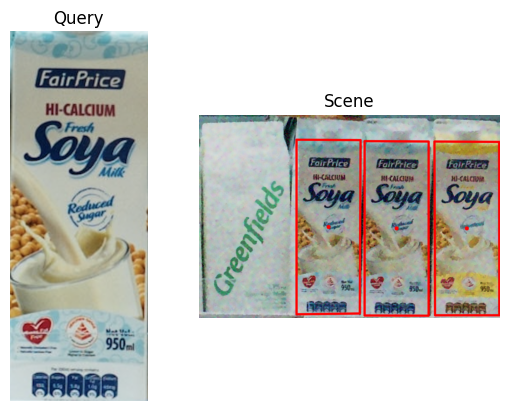

Product 23 - 3 instance found:
  Instance 0  [position: (487, 123), width: 321px, height: 873px]
  Instance 1  [position: (827, 130), width: 321px, height: 873px]
  Instance 2  [position: (1176, 132), width: 325px, height: 869px]


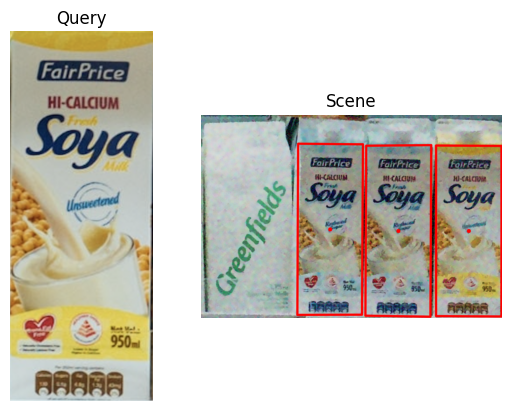

Product 24 - 3 instance found:
  Instance 0  [position: (1174, 152), width: 328px, height: 855px]
  Instance 1  [position: (481, 143), width: 329px, height: 856px]
  Instance 2  [position: (821, 150), width: 330px, height: 858px]


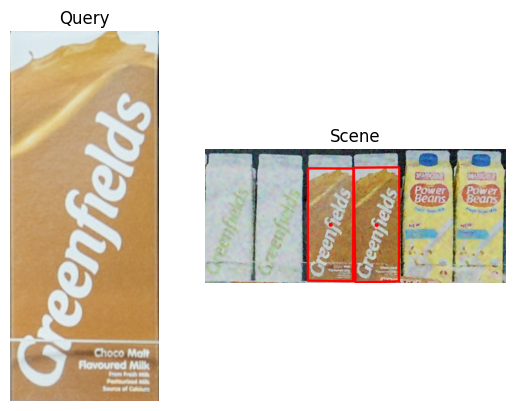

Product 19 - 2 instance found:
  Instance 0  [position: (508, 95), width: 226px, height: 559px]
  Instance 1  [position: (735, 90), width: 226px, height: 570px]


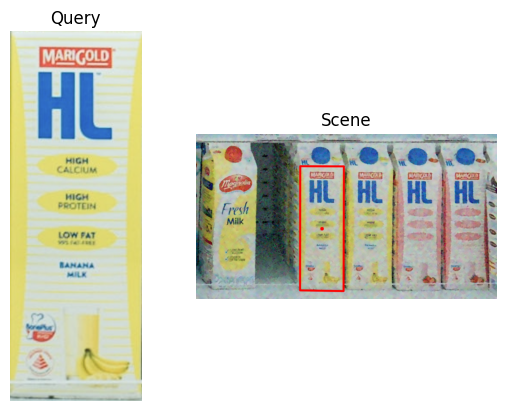

Product 21 - 1 instance found:
  Instance 0  [position: (586, 186), width: 248px, height: 702px]


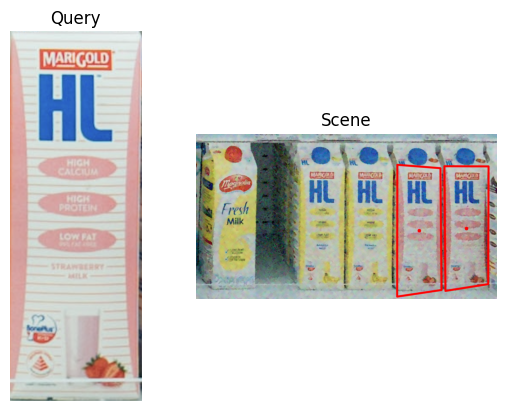

Product 22 - 2 instance found:
  Instance 0  [position: (1133, 178), width: 251px, height: 741px]
  Instance 1  [position: (1399, 186), width: 250px, height: 701px]


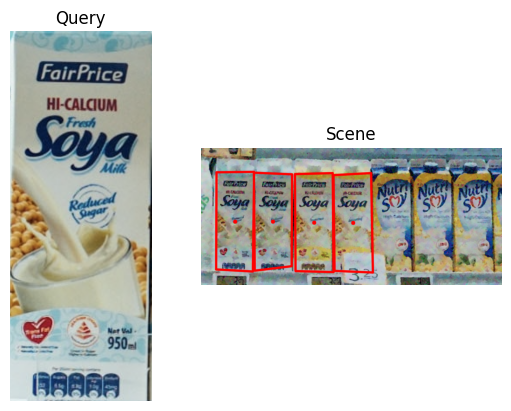

Product 17 - 4 instance found:
  Instance 0  [position: (74, 117), width: 188px, height: 491px]
  Instance 1  [position: (260, 121), width: 189px, height: 483px]
  Instance 2  [position: (652, 123), width: 195px, height: 490px]
  Instance 3  [position: (462, 123), width: 191px, height: 488px]


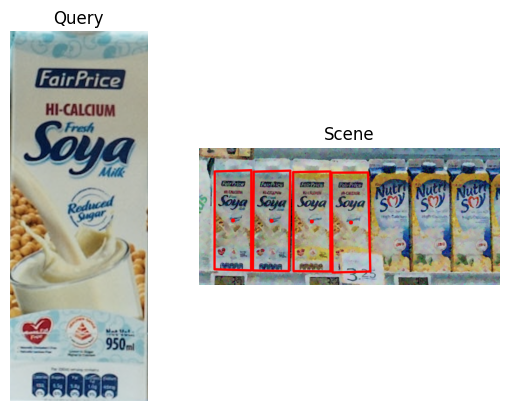

Product 23 - 4 instance found:
  Instance 0  [position: (265, 111), width: 185px, height: 495px]
  Instance 1  [position: (76, 109), width: 182px, height: 494px]
  Instance 2  [position: (652, 120), width: 192px, height: 493px]
  Instance 3  [position: (463, 115), width: 185px, height: 493px]


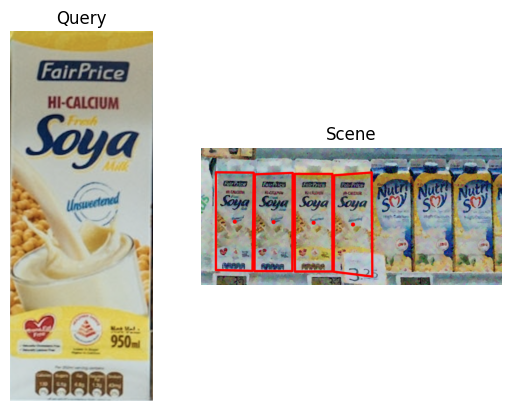

Product 24 - 4 instance found:
  Instance 0  [position: (461, 127), width: 187px, height: 481px]
  Instance 1  [position: (653, 120), width: 191px, height: 513px]
  Instance 2  [position: (263, 122), width: 189px, height: 484px]
  Instance 3  [position: (73, 119), width: 187px, height: 486px]


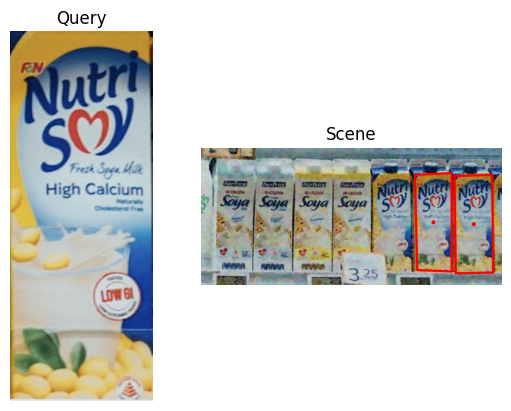

Product 25 - 2 instance found:
  Instance 0  [position: (1053, 123), width: 182px, height: 485px]
  Instance 1  [position: (1248, 132), width: 191px, height: 485px]


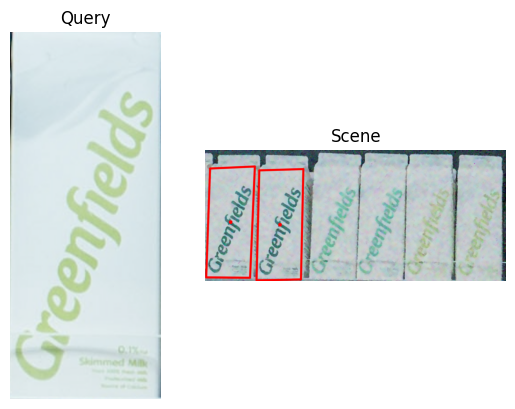

Product 18 - 2 instance found:
  Instance 0  [position: (6, 88), width: 264px, height: 599px]
  Instance 1  [position: (278, 102), width: 254px, height: 599px]


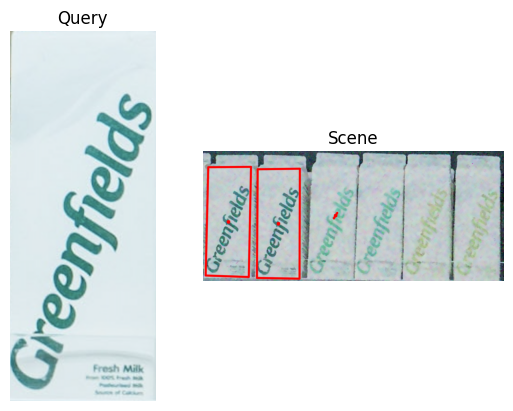

Product 26 - 3 instance found:
  Instance 0  [position: (14, 90), width: 246px, height: 593px]
  Instance 1  [position: (291, 100), width: 233px, height: 592px]
  Instance 2  [position: (707, 337), width: 19px, height: 31px]


In [319]:
for scene_path in dn_scenes_b:
    dn_scene = cv2.imread(scene_path)
    dn_scene = cv2.cvtColor(dn_scene, cv2.COLOR_BGR2RGB)

    j=15
    for obj_path in objs_b:
        obj = cv2.imread(obj_path)
        obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)

        scene_copy = dn_scene.copy()
        obj_copy=obj.copy()

        kp_scene=[]
        instances=[]

        track_b(scene_copy, obj_copy, kp_scene, instances, plot=True)

        j += 1  

#TODO: complete the integration of show_matches function with this code
